# 03_explorative_data_analysis.ipynb

**Project:** ds-air-pollution-prediction  
**Author:** Iris Winkler, Carlos Duque, Johannes Gooth  
**Date:** April 29, 2024

---

## 📘 Introduction

In this notebook, we will focus on the Exploratory Data Analysis (EDA) phase of our project. After successfully cleaning and preprocessing the dataset, our primary objective here is to explore the data in depth, uncover patterns, and gain insights for modelling.

### Key Steps:
1. **Descriptive Statistics:** We will begin by generating summary statistics to understand the central tendencies, dispersion, and overall structure of the data.

2. **Univariate Analysis:** This step involves examining individual variables to identify their distributions, ranges, and potential anomalies.

3. **Bivariate Analysis:** We will analyze relationships between our targed variable pm2_5 and other variables to uncover correlations and interactions that may be important for our modelling.
   
4. **Visualizations:** We will use various graphical representations to better understand the data, including histograms, box plots,and heatmaps.

### Expected Outcome:
A thorough understanding of the dataset, with key insights identified that will inform the next step: modeling.

---

## ⚙️ Setting-Up the Working Environment

In [12]:
# Avoid restarting Kernel 
%load_ext autoreload
%autoreload 2

import sys
# setting path
sys.path.append('../')

import os

# Import of relevant packages
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

from src.preprocessing.processing_functions import * 
from src.preprocessing.validation_functions import * 
from src.visualization.visualization_functions import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


---

## 📥 Loading the Data

In [13]:
# Load the data into a Pandas DataFrame
df = pd.read_csv('../data/air_pollution_data_cleaned_and_preprocessed.csv')

---

## 📊 Descriptive Statistics

Let's begin by examining the numerical variables and their descriptive statistics for all features. This will provide us with an overview of the central tendencies, variability, and distribution of the data. Understanding these basic statistics is crucial for identifying patterns and potential issues within the dataset.

In [14]:
df.describe()

,site_latitude,site_longitude,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,...,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5,day,day_of_week
count,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,...,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8.071000e+03,8071.000000,8071.000000,8071.000000
mean,4.225753e-17,-2.253735e-16,-5.634337e-16,-3.521461e-18,-3.697534e-17,-1.760730e-17,8.803652e-18,-2.465023e-17,6.690775e-17,-2.817169e-17,...,1.972018e-16,-3.169315e-17,-4.225753e-17,-1.408584e-17,6.514702e-17,-1.126867e-16,2.183306e-16,24.639296,14.975220,3.100359
std,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,...,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,1.000062e+00,24.878920,8.800227,1.891699
min,-1.900999e+00,-2.879454e+00,-1.075553e+00,-2.790667e+00,-2.216325e+00,-3.953398e+00,-1.984715e+00,-1.125737e+00,-2.527378e+00,-1.843221e+00,...,-2.174988e+00,-1.294896e+01,-1.343113e+01,-1.099045e+00,-2.084239e+00,-1.839724e+00,-2.632419e+00,1.200000,1.000000,0.000000
25%,-1.610826e-01,2.471807e-01,-1.075553e+00,-7.526288e-01,-7.647359e-01,-5.459093e-01,-9.606315e-01,-1.003474e+00,-7.097884e-01,-9.491554e-01,...,-6.008151e-01,1.027192e-01,9.134673e-02,-9.978583e-01,-7.386337e-01,-9.467775e-01,-6.649003e-01,13.270600,7.000000,2.000000
50%,-1.406692e-01,2.505703e-01,1.502008e-01,1.934648e-01,1.994214e-02,1.851716e-01,2.335566e-02,9.452255e-01,1.064704e-01,1.359282e-01,...,1.591186e-03,1.060247e-01,1.167043e-01,9.155380e-01,2.006979e-01,1.806613e-01,2.904375e-02,18.375400,15.000000,3.000000
75%,-1.211549e-01,2.548960e-01,1.502008e-01,3.342202e-01,8.165612e-02,2.483851e-01,4.758961e-02,9.948796e-01,7.533892e-01,9.237406e-01,...,5.417403e-02,1.112387e-01,1.306740e-01,9.958670e-01,8.262275e-01,9.025353e-01,7.326421e-01,28.838400,23.000000,5.000000
max,2.766211e+00,7.098474e-01,3.827463e+00,2.293389e+00,8.307665e+00,2.525315e+00,8.467849e+00,1.055204e+00,1.856641e+00,1.630112e+00,...,4.784653e+00,9.321027e-01,3.028623e-01,1.040694e+00,4.903791e+00,3.100556e+00,2.485155e+00,456.193333,31.000000,6.000000


---

## 🔢 Visualizing the Distribution of Numeric Variables - Univariate Analysis
In this section, we perform univariate analysis by visualizing the distributions of key numeric features using histograms, box plots, and density plots. These visualizations help identify patterns, central tendencies, variability, and potential outliers, providing essential insights that inform data preprocessing and modeling decisions.

In [15]:
# List of columns to plot
columns_to_plot = [
    'site_latitude', 'site_longitude', 'hour',
    'sulphurdioxide_so2_column_number_density',
    'sulphurdioxide_so2_column_number_density_amf',
    'sulphurdioxide_so2_slant_column_number_density',
    'sulphurdioxide_cloud_fraction', 'sulphurdioxide_sensor_azimuth_angle',
    'sulphurdioxide_sensor_zenith_angle',
    'sulphurdioxide_solar_azimuth_angle',
    'sulphurdioxide_solar_zenith_angle',
    'sulphurdioxide_so2_column_number_density_15km', 'month',
    'carbonmonoxide_co_column_number_density',
    'carbonmonoxide_h2o_column_number_density',
    'carbonmonoxide_cloud_height', 'carbonmonoxide_sensor_altitude',
    'carbonmonoxide_sensor_azimuth_angle',
    'carbonmonoxide_sensor_zenith_angle',
    'carbonmonoxide_solar_azimuth_angle',
    'carbonmonoxide_solar_zenith_angle',
    'nitrogendioxide_no2_column_number_density',
    'nitrogendioxide_tropospheric_no2_column_number_density',
    'nitrogendioxide_stratospheric_no2_column_number_density',
    'nitrogendioxide_no2_slant_column_number_density',
    'nitrogendioxide_tropopause_pressure',
    'nitrogendioxide_absorbing_aerosol_index',
    'nitrogendioxide_cloud_fraction', 'nitrogendioxide_sensor_altitude',
    'nitrogendioxide_sensor_azimuth_angle',
    'nitrogendioxide_sensor_zenith_angle',
    'nitrogendioxide_solar_azimuth_angle',
    'nitrogendioxide_solar_zenith_angle',
    'formaldehyde_tropospheric_hcho_column_number_density',
    'formaldehyde_tropospheric_hcho_column_number_density_amf',
    'formaldehyde_hcho_slant_column_number_density',
    'formaldehyde_cloud_fraction', 'formaldehyde_solar_zenith_angle',
    'formaldehyde_solar_azimuth_angle', 'formaldehyde_sensor_zenith_angle',
    'formaldehyde_sensor_azimuth_angle',
    'uvaerosolindex_absorbing_aerosol_index',
    'uvaerosolindex_sensor_altitude', 'uvaerosolindex_sensor_azimuth_angle',
    'uvaerosolindex_sensor_zenith_angle',
    'uvaerosolindex_solar_azimuth_angle',
    'uvaerosolindex_solar_zenith_angle', 'ozone_o3_column_number_density',
    'ozone_o3_column_number_density_amf',
    'ozone_o3_slant_column_number_density',
    'ozone_o3_effective_temperature', 'ozone_cloud_fraction',
    'ozone_sensor_azimuth_angle', 'ozone_sensor_zenith_angle',
    'ozone_solar_azimuth_angle', 'ozone_solar_zenith_angle',
    'cloud_cloud_fraction', 'cloud_cloud_top_pressure',
    'cloud_cloud_top_height', 'cloud_cloud_base_pressure',
    'cloud_cloud_base_height', 'cloud_cloud_optical_depth',
    'cloud_surface_albedo', 'cloud_sensor_azimuth_angle',
    'cloud_sensor_zenith_angle', 'cloud_solar_azimuth_angle',
    'cloud_solar_zenith_angle', 'pm2_5', 'day', 'day_of_week'
]

### Boxplots
To gain a deeper understanding of the spread and central tendencies of our numeric variables, we will create boxplots for several key features in the dataset. This will help us identify any outliers, the overall distribution, and any potential skewness in the data.

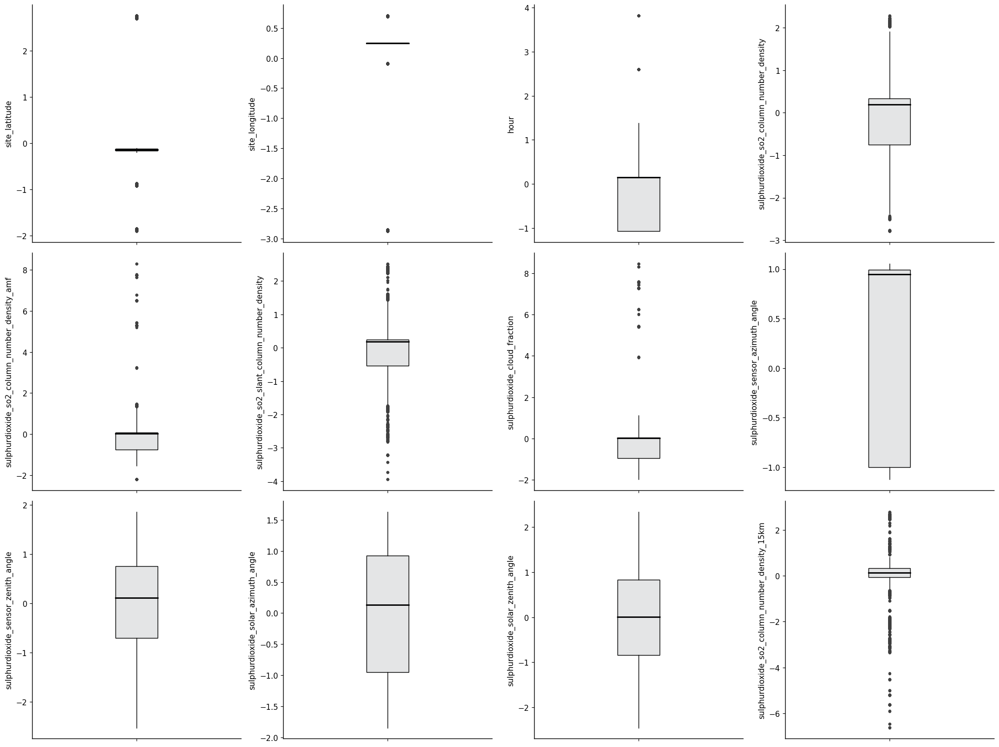

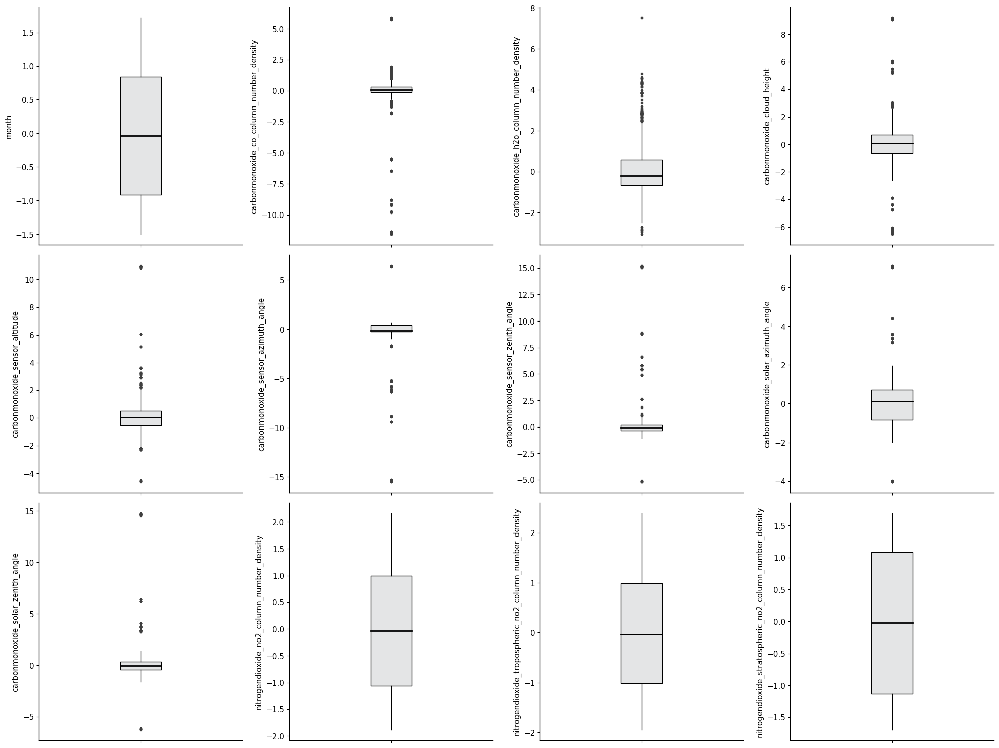

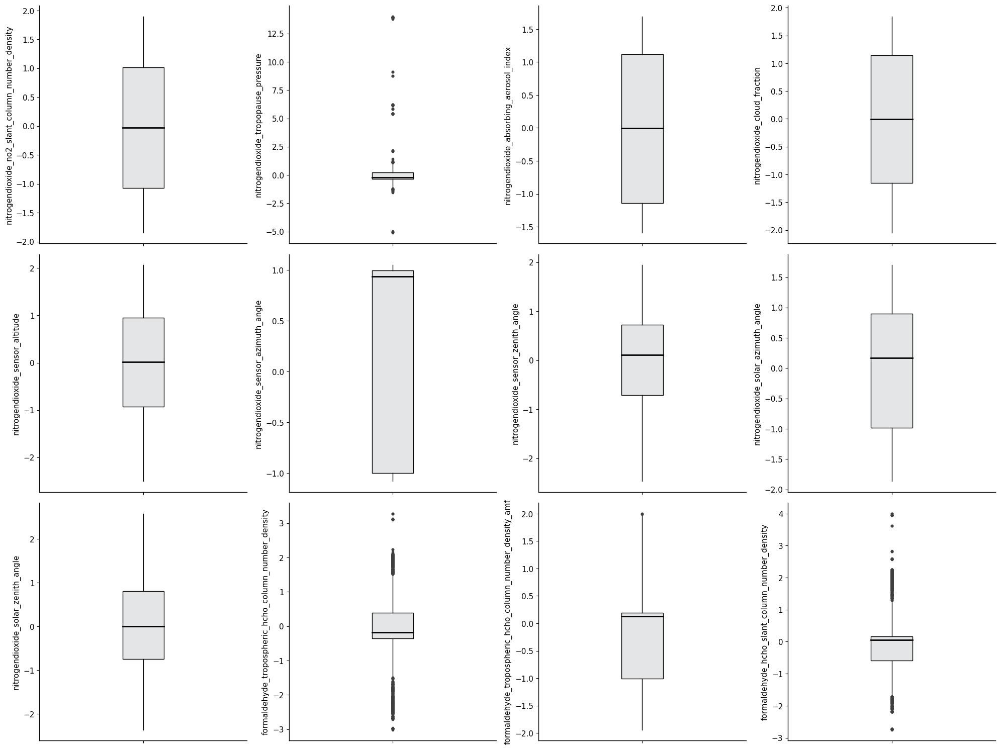

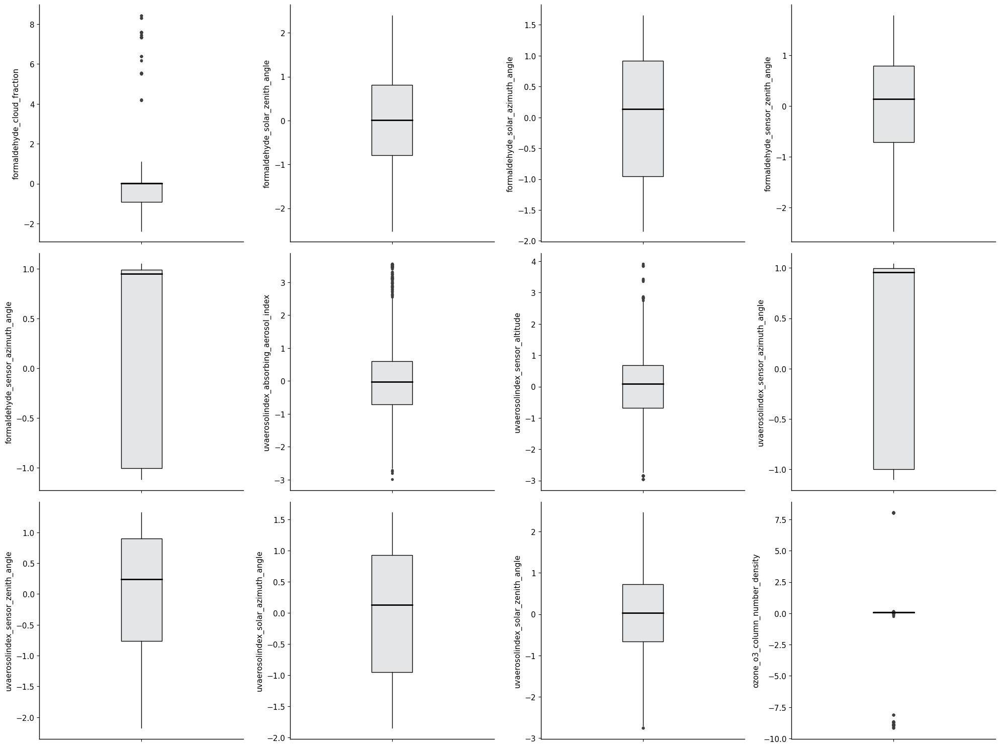

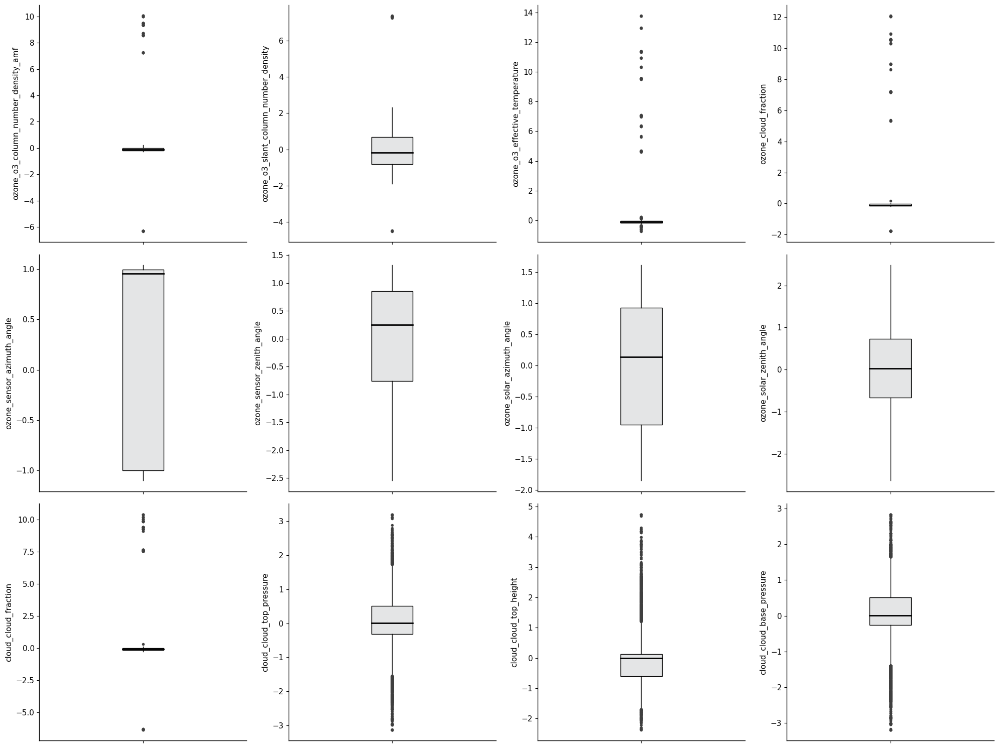

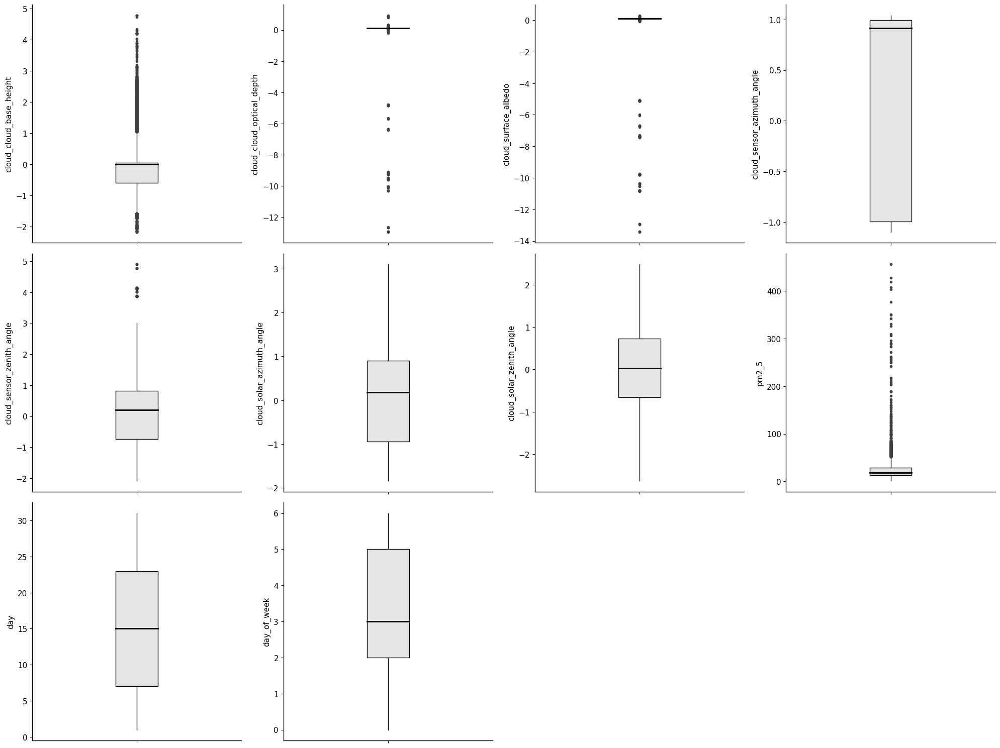

In [16]:
# Plot the boxplot
plot_box_plots(
    df=df,
    columns_to_plot=columns_to_plot,
)

### Violin Plots

To gain a comprehensive understanding of the distribution and density of our numeric variables, we will create violin plots for several key features in the dataset. Violin plots combine the elements of boxplots and kernel density plots, providing a detailed visualization of the data’s distribution shape, including its modality and symmetry. This approach allows us to identify not only the central tendencies and variability but also any underlying patterns or anomalies that may not be apparent with boxplots alone. These plots will help us uncover subtle distribution characteristics, detect multimodal distributions, and highlight any potential outliers or skewness within the data.


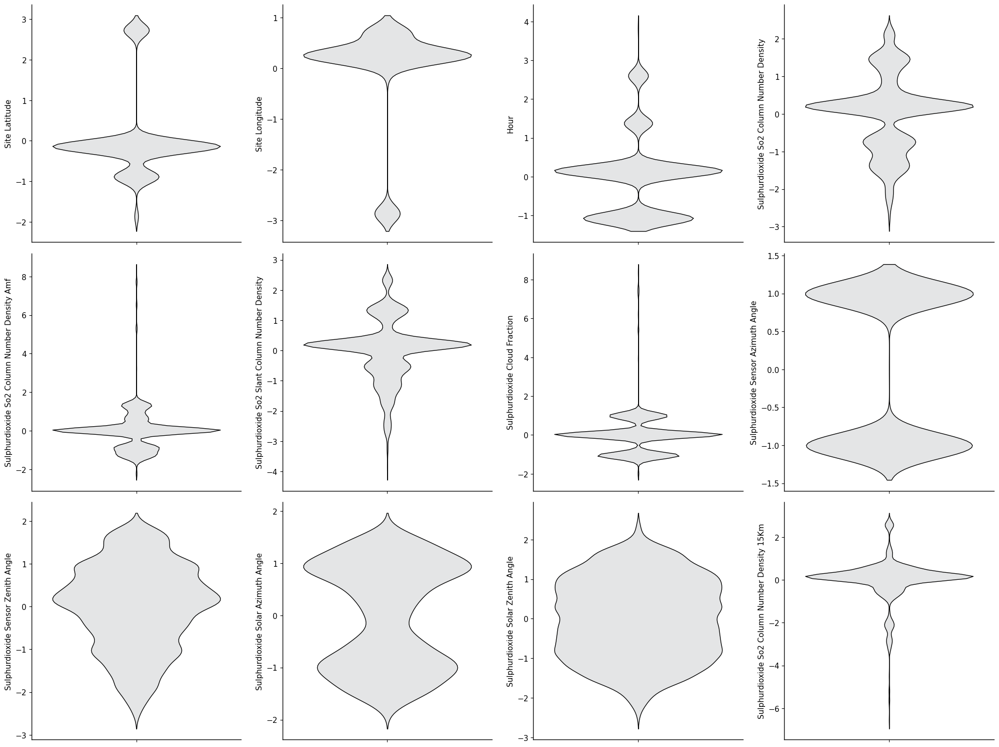

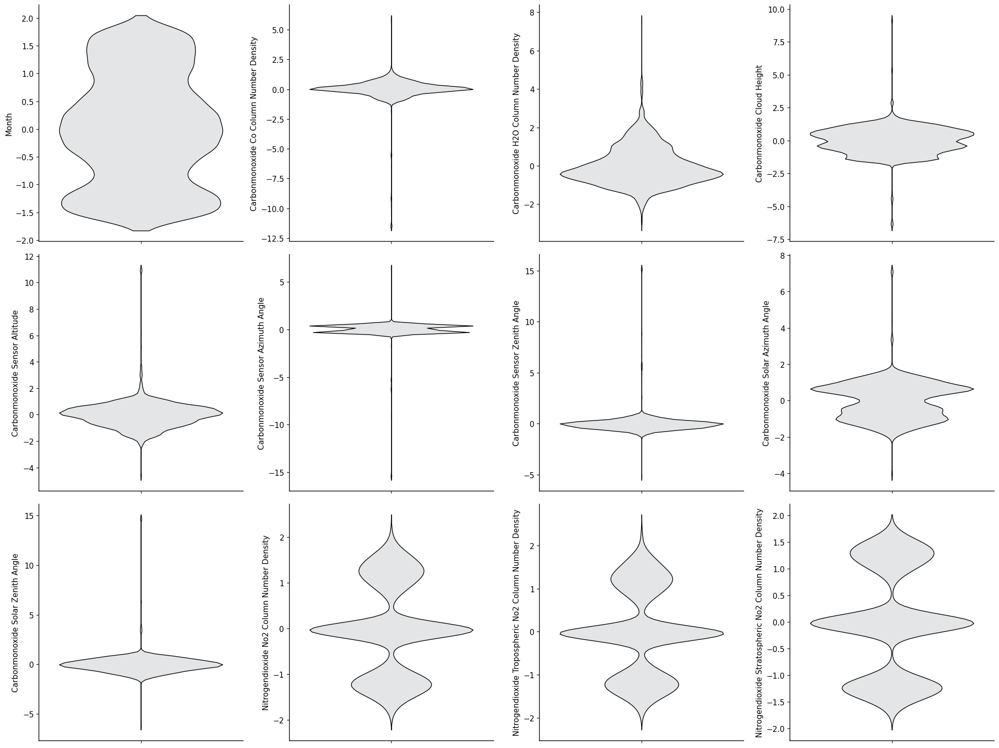

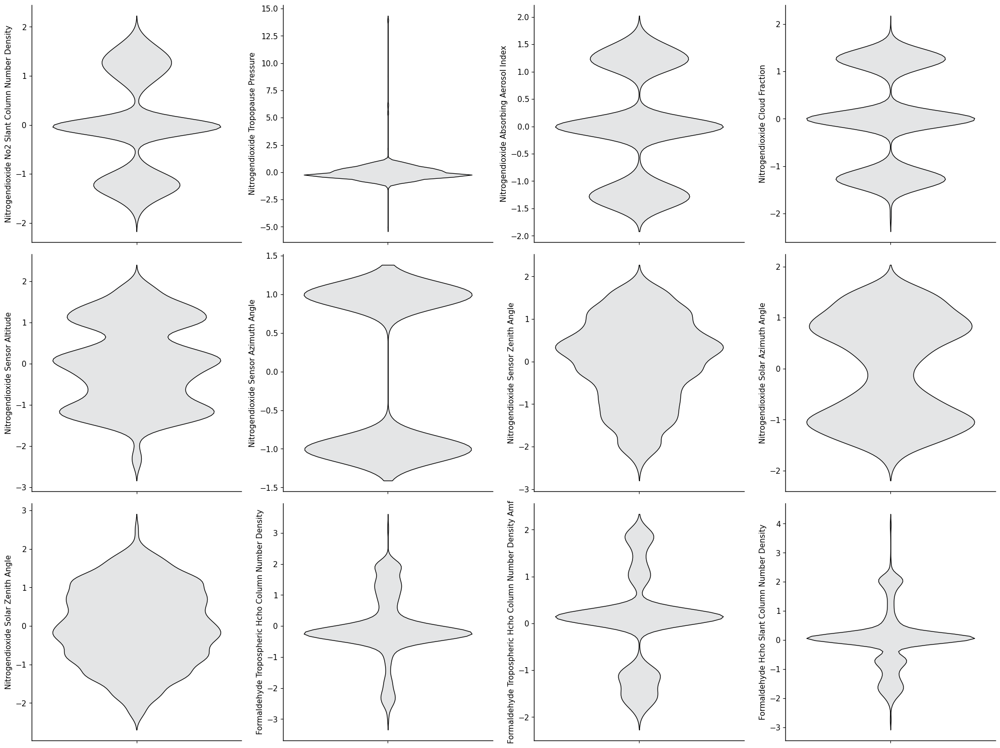

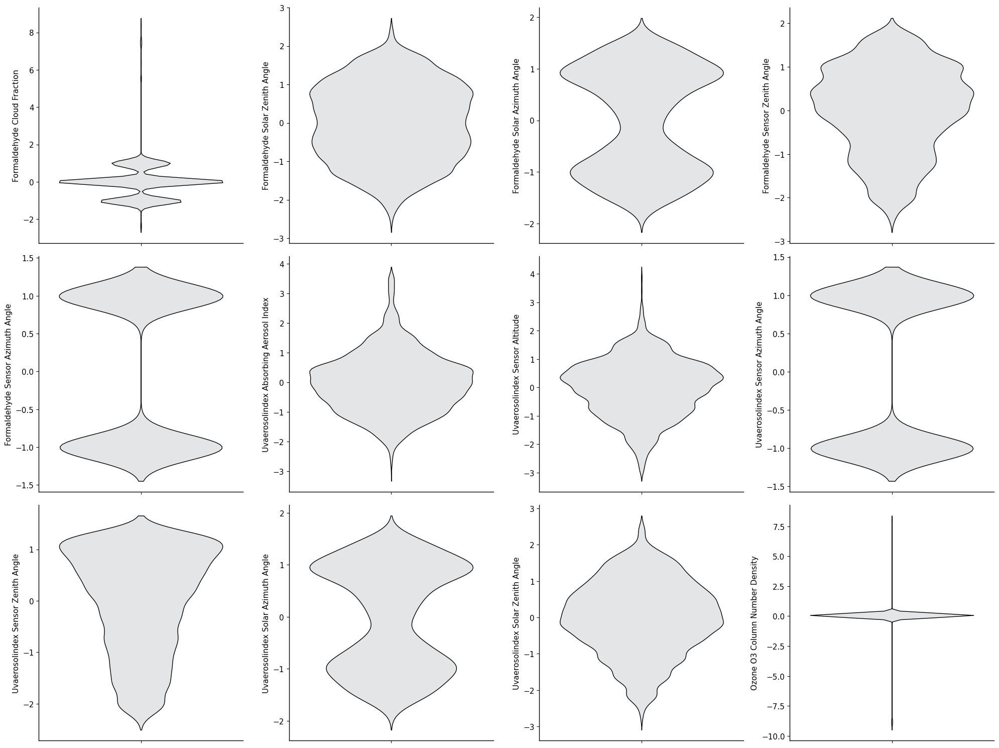

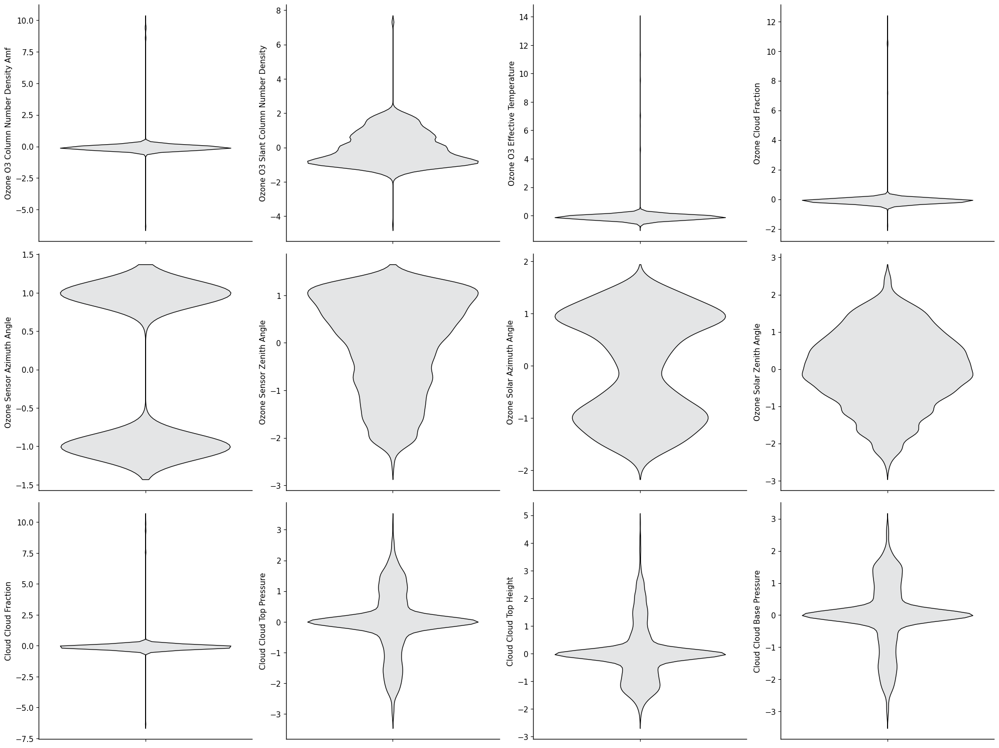

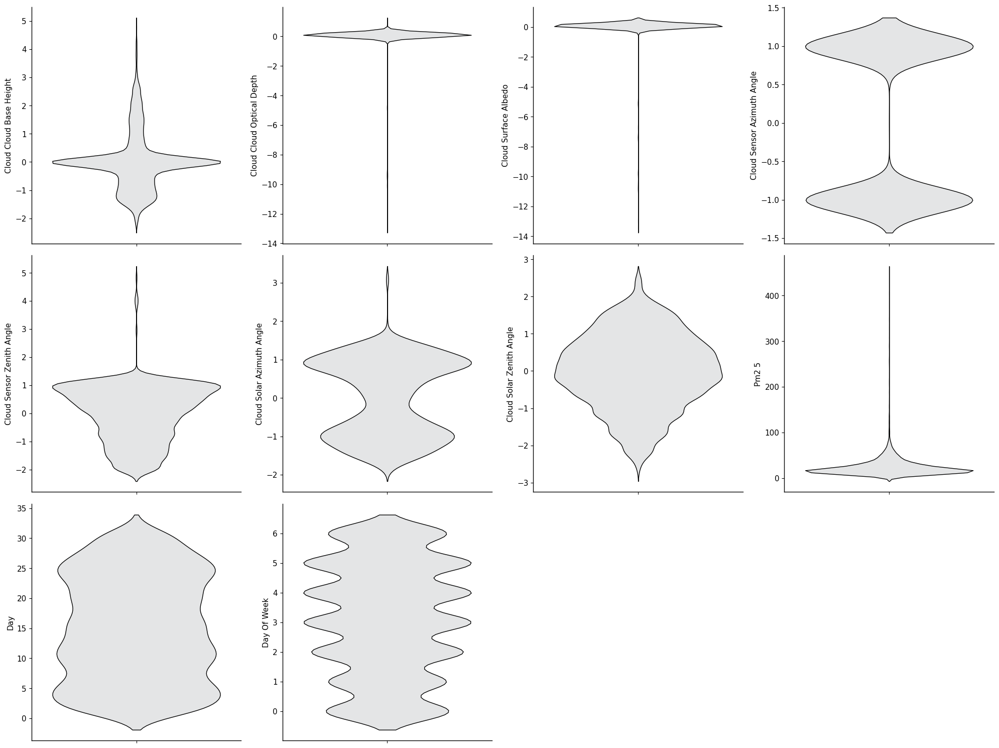

In [17]:
# Plot violin plots
plot_violin_plots(
    df=df,
    columns_to_plot=columns_to_plot,               
)

### Histograms
To better understand the distribution of key numeric variables in our dataset, we will create a series of histograms. These histograms will allow us to observe the frequency of different values within each variable, providing insights into their distribution patterns, potential outliers, and the overall spread of the data. 

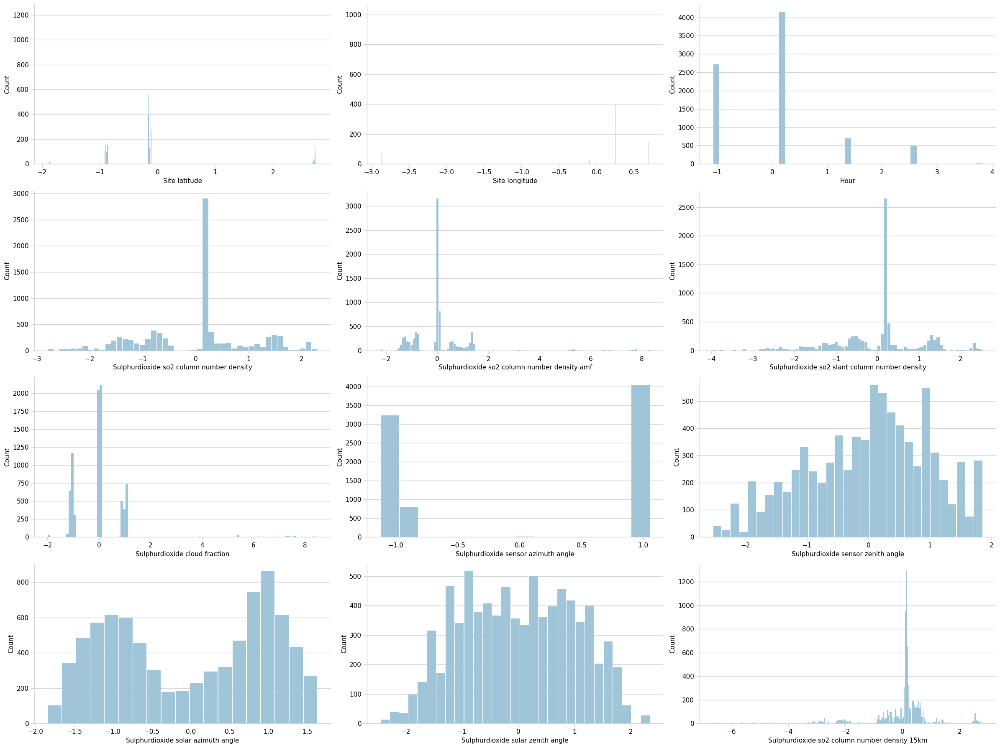

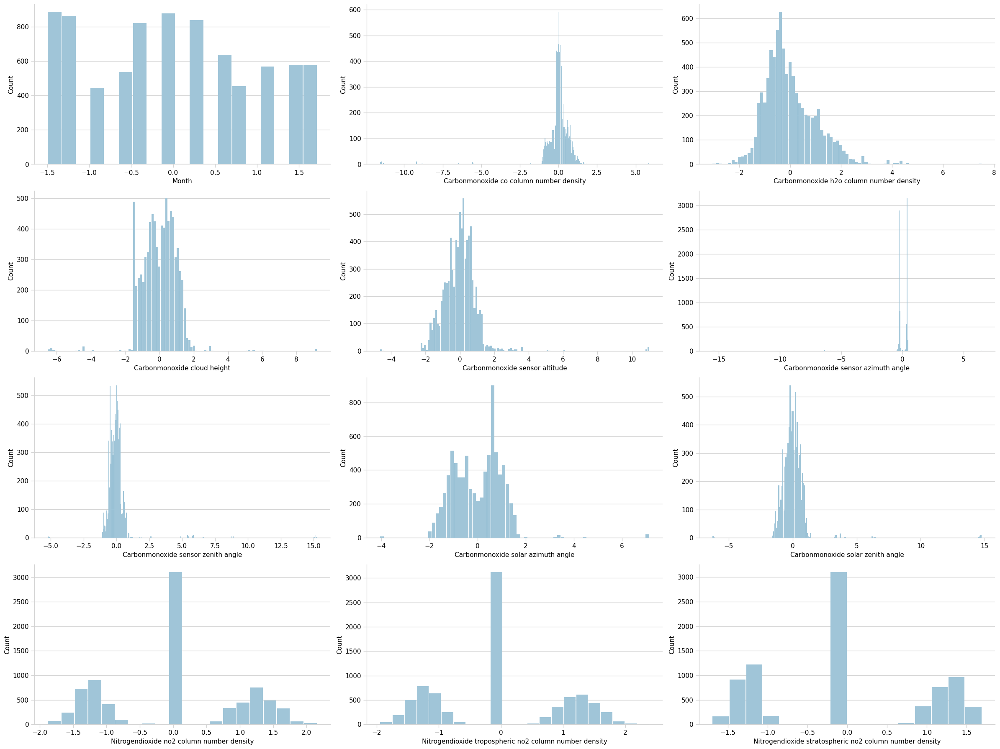

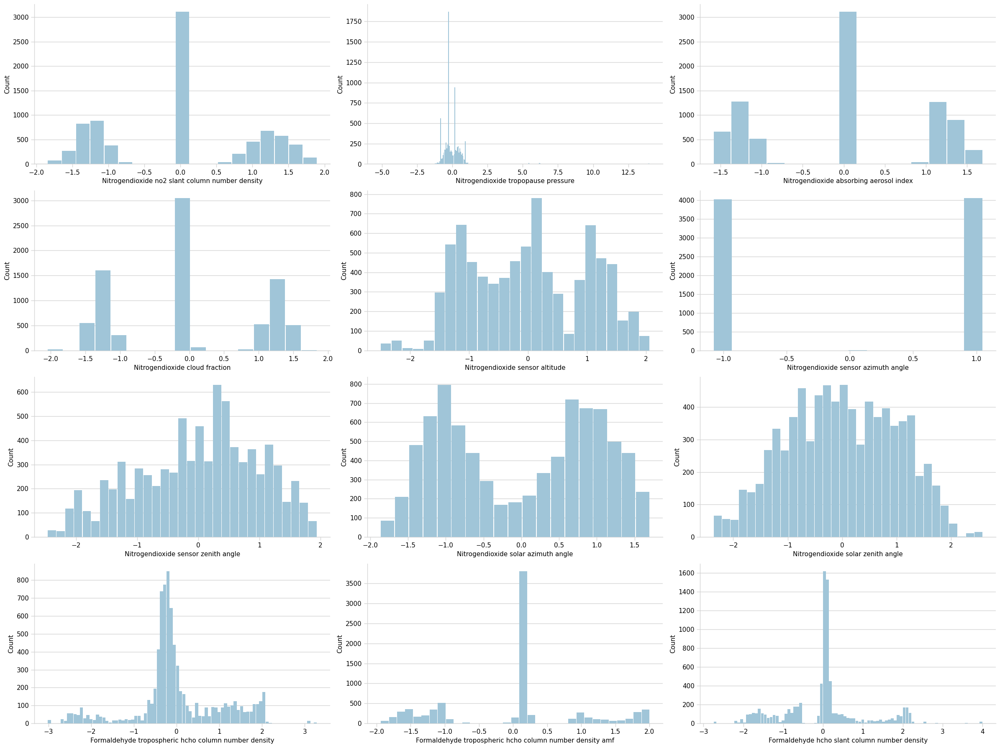

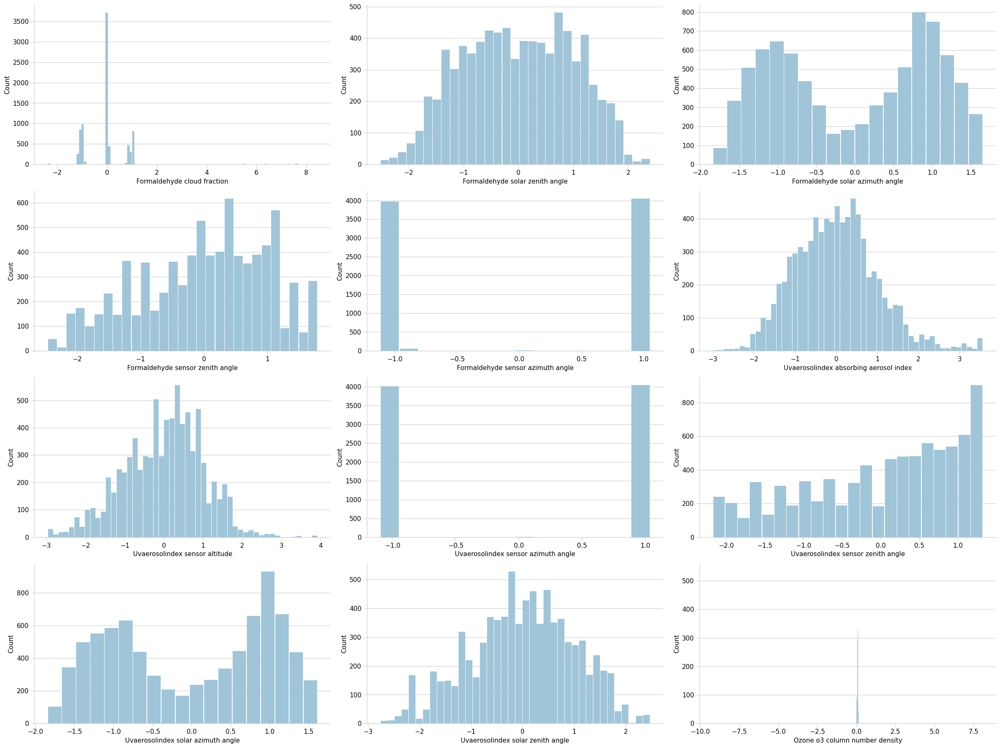

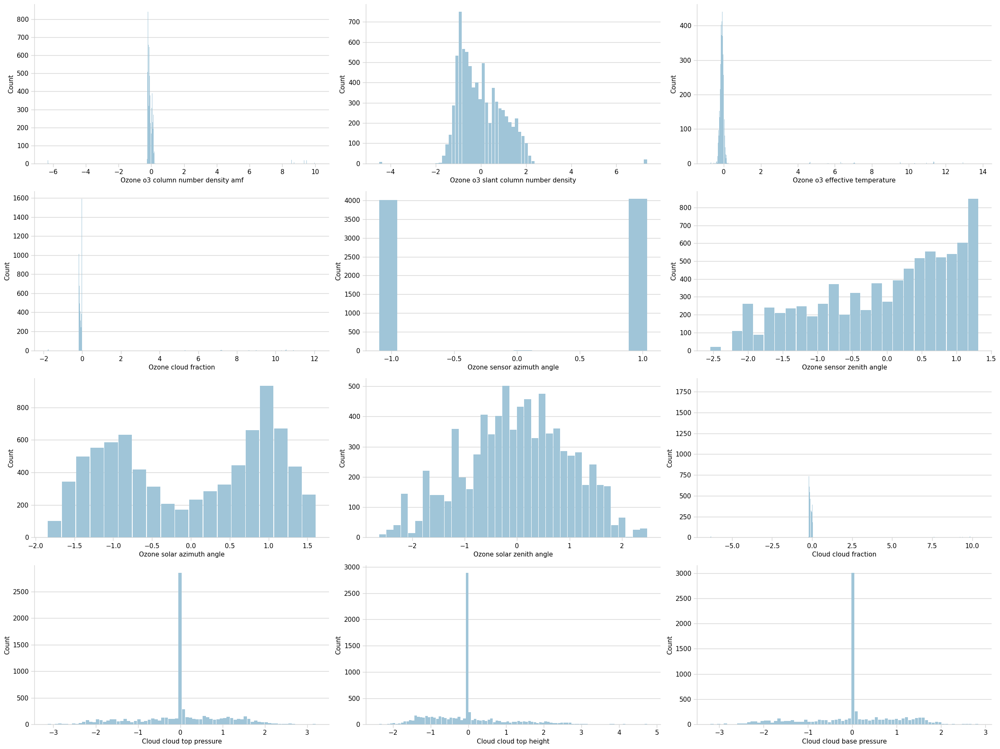

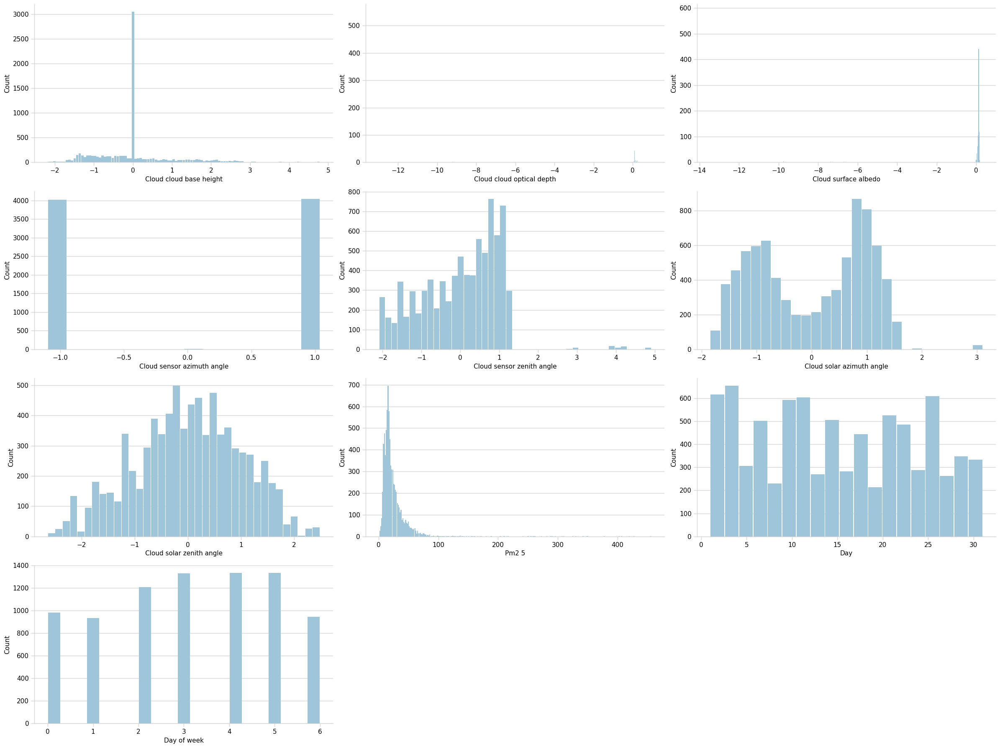

In [18]:
# Plot the histograms
plot_histograms(
    df=df,
    columns_to_plot=columns_to_plot,
    plots_per_fig=12,                   
    figsize=(24, 18)                                           
)

### Conclusion

Through our comprehensive univariate analysis, we have meticulously examined the distribution and statistical properties of each numeric variable within the dataset. The descriptive statistics, combined with visualizations such as box plots, violin plots, and histograms reveal that the data exhibits relatively well-behaved distributions without significant skewness or outliers that could adversely affect our modeling efforts.

Key observations from the analysis include:

- Central Tendencies and Dispersion: The standard deviations and interquartile ranges suggest reasonable variability, ensuring that the models can effectively capture the underlying     patterns without being unduly influenced by extreme values.

- Absence of Problematic Outliers: Box plots and violin plots have confirmed that there are no extreme outliers present in the key features. This cleanliness enhances the reliability of subsequent predictive models.

- Consistent Data Quality: All histograms display expected distribution shapes, further validating the integrity of the data. Additionally, the absence of missing values and the correct data types for each feature ensure that the dataset is fully prepared for the modeling phase without necessitating additional preprocessing steps.

Overall, the univariate analysis confirms that the dataset is robust and free from anomalies that could hinder the performance of our predictive models. With a solid understanding of each individual feature’s behavior, we are well-positioned to advance to the next stage of our project: building and optimizing models to accurately forecast air pollution levels.

---

## 📈 Relationships in the Data - Bivariate Analysis

 In this section, we perform bivariate analysis by examining the correlations and associations between key numeric features and the target variable, PM2.5 concentrations. Through scatter plots, correlation coefficients, and heatmaps, we aim to identify significant relationships that can inform feature selection, engineering, and modeling strategies for predicting air pollution levels effectively.

### Correlation Matrix

To explore the relationships between different numerical variables in our dataset, we will create a correlation matrix. This matrix quantifies the strength and direction of linear relationships between pairs of variables. Visualizing this correlation matrix with a heatmap allows us to quickly identify strong correlations, both positive and negative, which can provide insights into how different features interact with each other.

The heatmap will help us understand which variables might be influencing each other and could be particularly useful for identifying multicollinearity or potential predictors for further analysis.

In [19]:
# Correlation matrix between the numeric variables
corr_columns=columns_to_plot
corr_mtrx = df[corr_columns].corr()

# Display the correlation matrix
corr_mtrx

,site_latitude,site_longitude,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,...,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5,day,day_of_week
site_latitude,1.000000,-0.962193,0.704178,-0.015124,-0.022549,-0.018564,-0.006293,-0.002430,0.003313,-0.296538,...,-0.008789,0.014385,0.005875,-0.002056,0.003202,-0.295397,0.093807,0.288082,0.016316,0.019715
site_longitude,-0.962193,1.000000,-0.737978,0.026151,0.034431,0.029180,0.016008,0.000402,-0.008389,0.332879,...,0.042428,-0.027294,-0.016945,0.000074,-0.002709,0.333835,-0.126518,-0.305682,-0.018946,-0.028434
hour,0.704178,-0.737978,1.000000,-0.400754,-0.334303,-0.361494,-0.322895,-0.510107,0.071242,-0.203388,...,-0.135570,0.072237,0.059779,-0.510427,-0.152869,-0.210923,0.549149,0.191801,-0.015438,0.025632
sulphurdioxide_so2_column_number_density,-0.015124,0.026151,-0.400754,1.000000,0.474120,0.980953,0.424563,0.689647,-0.363617,0.214223,...,0.038303,0.183573,0.177529,0.697169,-0.067685,0.161695,-0.515946,0.002173,-0.001501,0.006210
sulphurdioxide_so2_column_number_density_amf,-0.022549,0.034431,-0.334303,0.474120,1.000000,0.304154,0.986604,0.549399,-0.331836,0.122544,...,-0.068070,-0.529543,-0.568551,0.557102,0.246829,0.228402,-0.429583,-0.011916,-0.012837,0.017362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cloud_solar_azimuth_angle,-0.295397,0.333835,-0.210923,0.161695,0.228402,0.161268,0.132131,-0.052004,-0.045755,0.976747,...,-0.030632,-0.172895,-0.168885,-0.051334,0.027490,1.000000,0.023035,-0.227141,0.057122,-0.038494
cloud_solar_zenith_angle,0.093807,-0.126518,0.549149,-0.515946,-0.429583,-0.458673,-0.444210,-0.683644,0.278301,0.052966,...,-0.195101,0.172324,0.167340,-0.683135,-0.020128,0.023035,1.000000,0.051217,-0.030827,0.013106
pm2_5,0.288082,-0.305682,0.191801,0.002173,-0.011916,-0.002970,0.009375,0.046985,-0.015520,-0.227344,...,-0.023160,0.012867,0.007716,0.046957,-0.005841,-0.227141,0.051217,1.000000,0.023378,0.001949
day,0.016316,-0.018946,-0.015438,-0.001501,-0.012837,0.003351,-0.022174,0.018027,0.008734,0.051366,...,0.030897,-0.032276,-0.025232,0.017003,0.010097,0.057122,-0.030827,0.023378,1.000000,0.038007


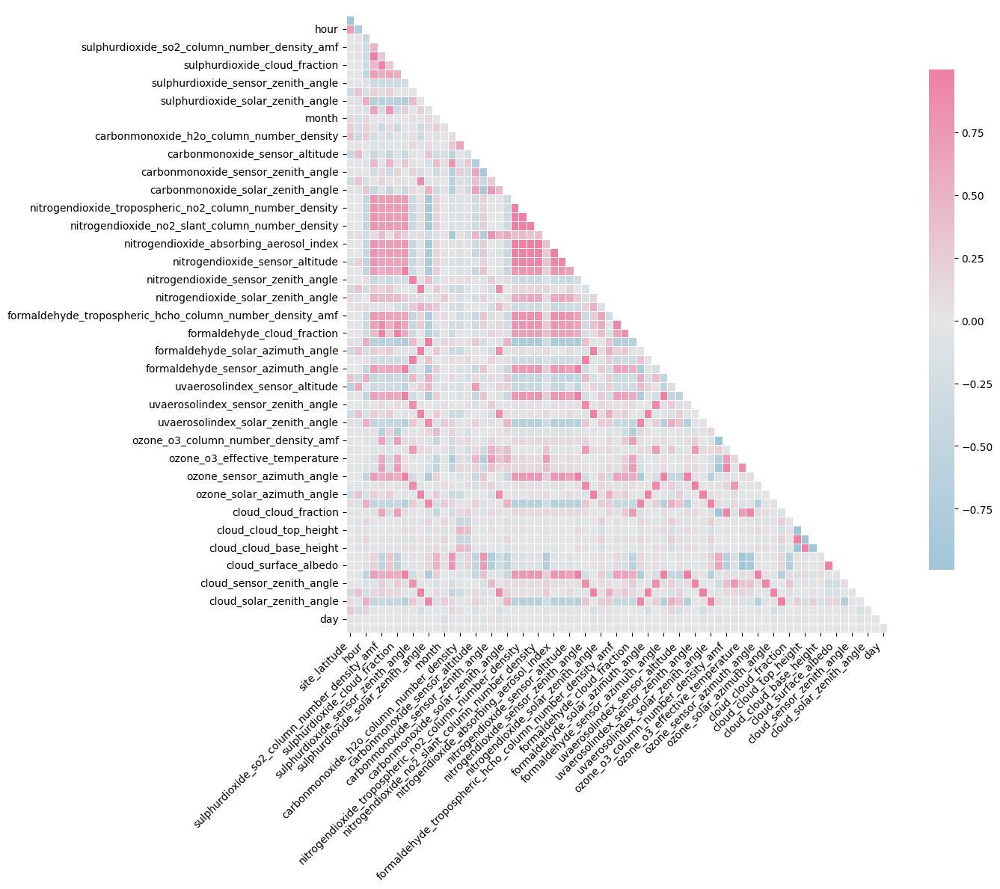

In [20]:
# Plotting the heatmap
plot_correlation_matrix_heatmap(corr_mtrx, annot=False)

### Correlations for 'pm2_5'
In this section, we examine the relationships between our target variable, PM2.5 concentration, and the other features in the dataset in more detail by repeating the corresponding scatter plots with a higher resolution.

In [21]:
# Find correlations of other columns with 'pm2_5' where the absolute value of correlation is greater than 0.2
high_corr_with_target = corr_mtrx['pm2_5'].abs().drop('pm2_5').loc[lambda x: x > 0.2]

print("Features with high correlation (|correlation| > 0.2) with 'pm2_5':")
print(high_corr_with_target)

Features with high correlation (|correlation| > 0.2) with 'pm2_5':
site_latitude                          0.288082
site_longitude                         0.305682
sulphurdioxide_solar_azimuth_angle     0.227344
carbonmonoxide_solar_azimuth_angle     0.211158
nitrogendioxide_solar_azimuth_angle    0.225693
formaldehyde_solar_azimuth_angle       0.226799
uvaerosolindex_solar_azimuth_angle     0.227832
ozone_solar_azimuth_angle              0.227879
cloud_solar_azimuth_angle              0.227141
Name: pm2_5, dtype: float64


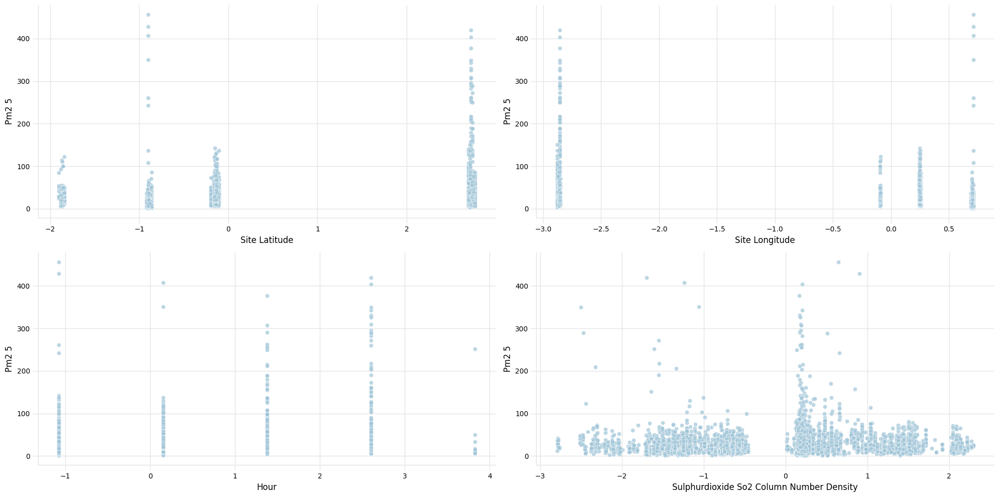

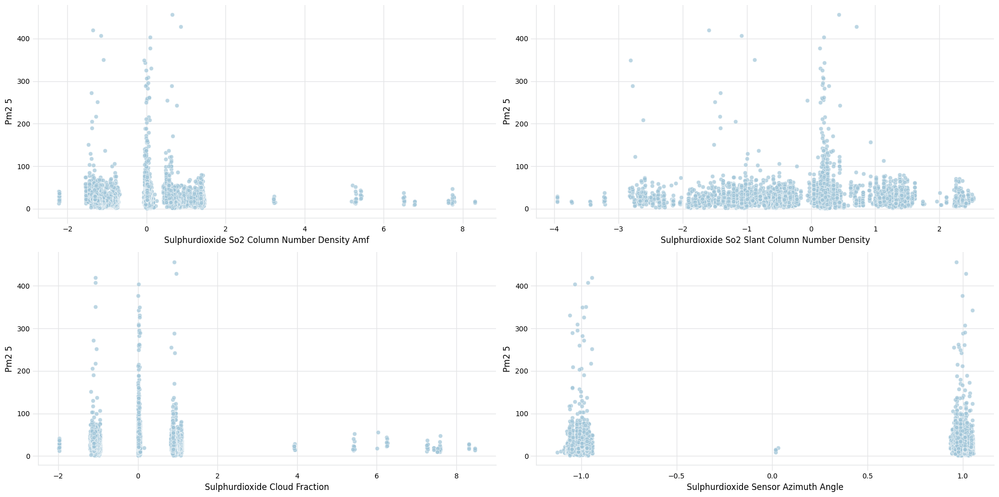

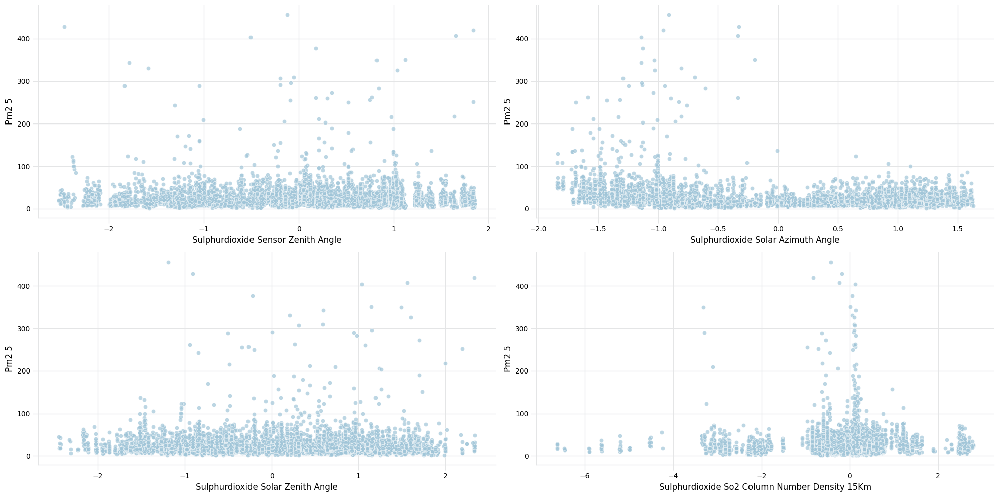

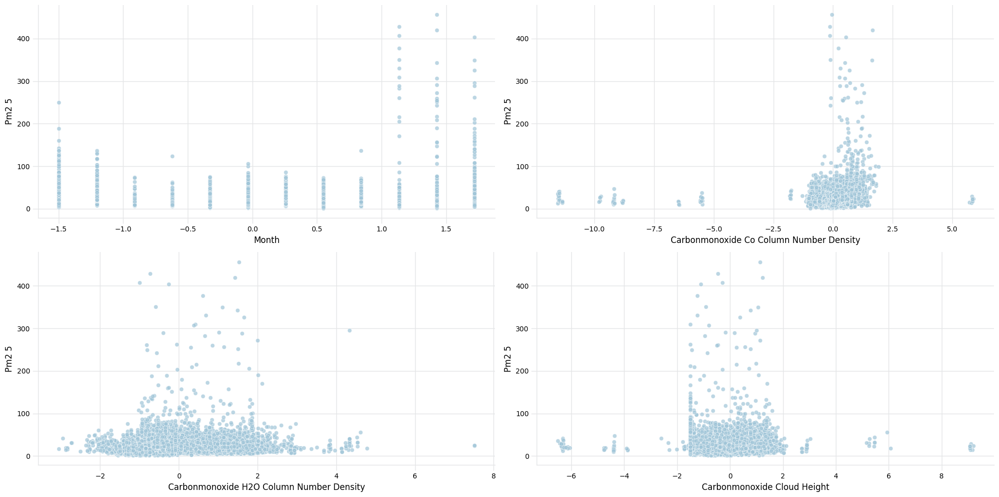

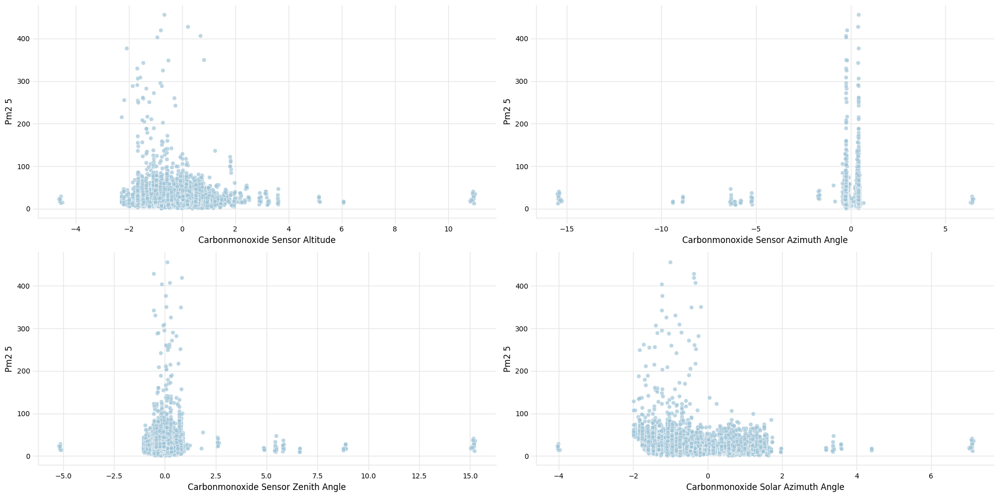

...

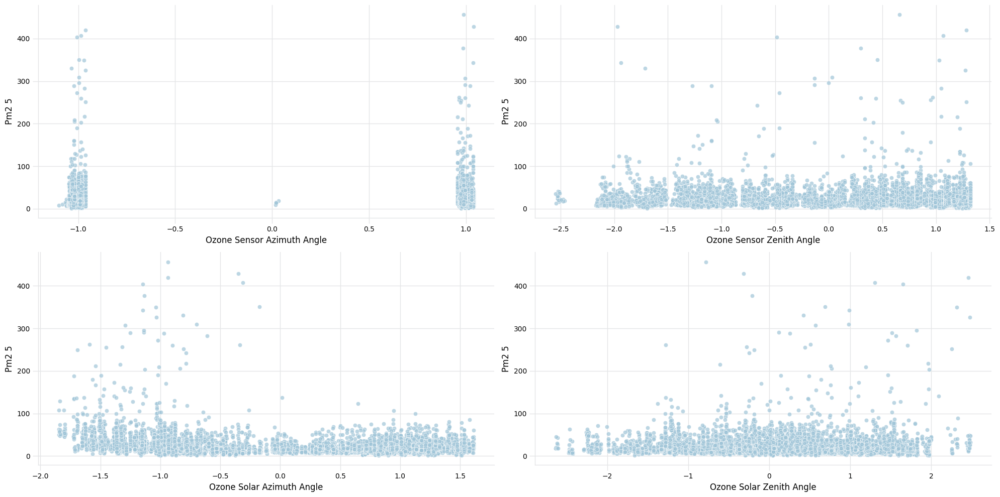

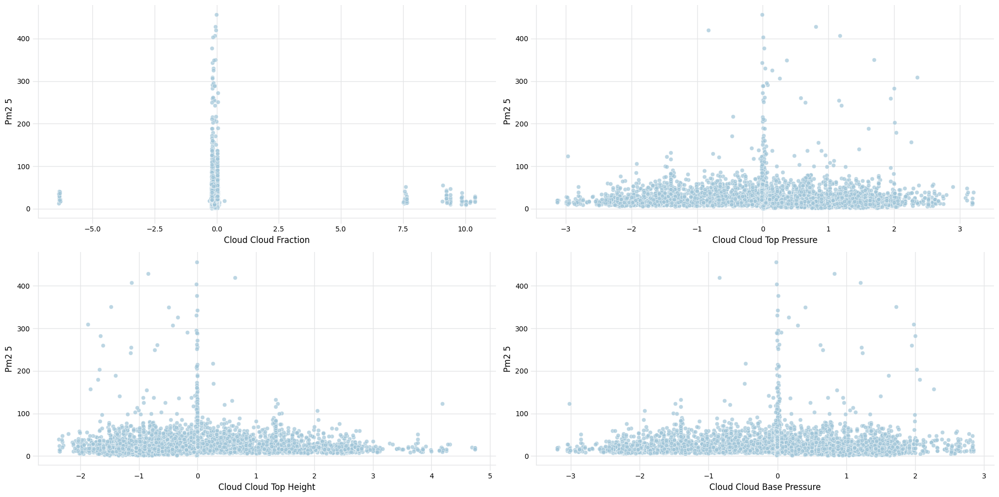

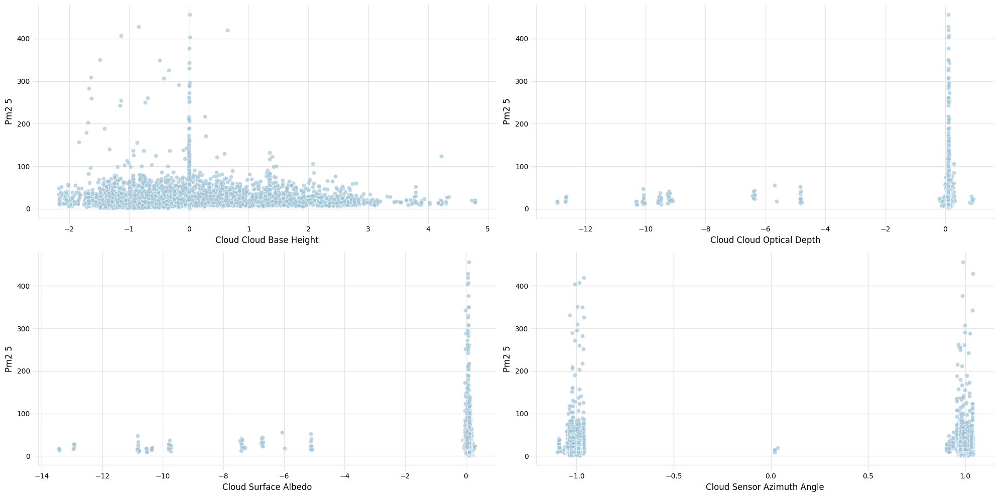

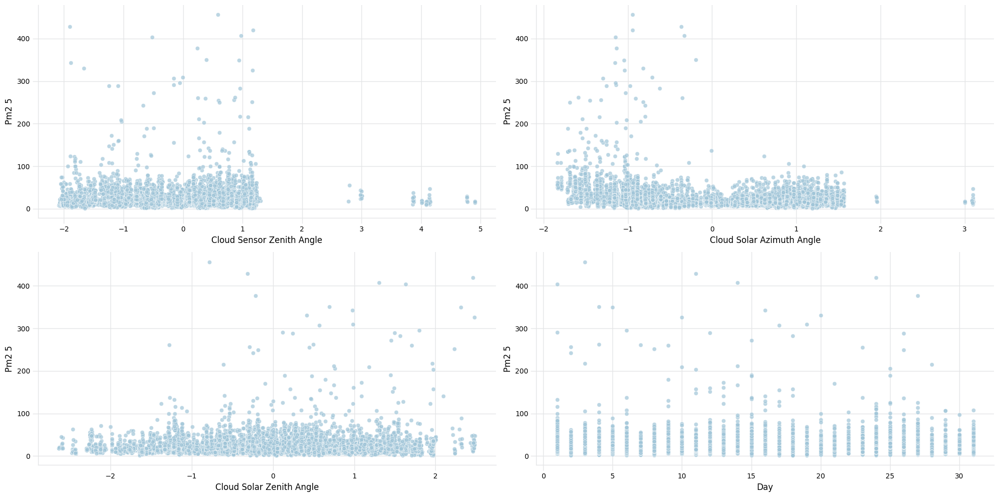

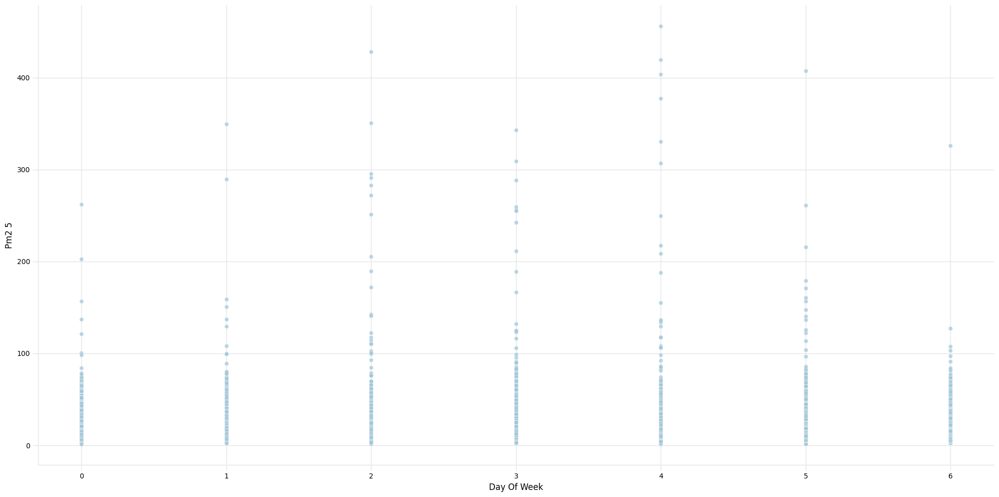

In [22]:
# Plot scatter plots of other columns with 'pm2_5'
plot_scatter_plots(df, columns_to_plot, target_variable='pm2_5', figsize=(20, 10), plots_per_fig=4)

### Conclusion

#### **1. Strong Correlations**

- **Geographical Coordinates:**
  - **`site_latitude` and `site_longitude`**: **-0.9562**
    - **Interpretation**: There's a **very strong negative correlation** between latitude and longitude. This suggests that as one increases, the other tends to decrease consistently. Such a pattern might indicate that data points are aligned along a specific geographical trend or boundary.

- **Sulphurdioxide (`SO2`) Variables:**
  - **`sulphurdioxide_so2_column_number_density` and `sulphurdioxide_so2_slant_column_number_density`**: **0.9962**
    - **Interpretation**: These two measurements are **extremely highly correlated**, almost identical in their variance. This redundancy implies that both variables might be representing the same underlying phenomenon or measurement with minimal differentiation.
  
  - **`sulphurdioxide_so2_column_number_density_amf`**: **0.7199** with **`sulphurdioxide_so2_column_number_density`**
    - **Interpretation**: A **strong positive correlation** indicates that as one increases, the other does as well. This reinforces the interconnected nature of `SO2` measurements in your dataset.

- **Solar and Sensor Angles:**
  - **`cloud_solar_azimuth_angle` and `sulphurdioxide_solar_azimuth_angle`**: **0.9739**
    - **Interpretation**: A **very strong positive correlation** suggests that the solar azimuth angles measured for clouds and sulphurdioxide are closely related, possibly influenced by the same environmental or observational factors.

  - **`sulphurdioxide_sensor_zenith_angle` and `cloud_solar_zenith_angle`**: **-0.6938**
    - **Interpretation**: A **strong negative correlation** indicates an inverse relationship between these two angles. As one increases, the other tends to decrease, which might reflect specific atmospheric conditions or measurement orientations.

#### **2. Moderate to Low Correlations**

- **Temporal Variables:**
  - **`hour` with `site_latitude` (0.6754)** and **`site_longitude` (-0.7126)**
    - **Interpretation**: These **moderate to strong correlations** suggest that the time of observation (`hour`) is related to the geographical positioning. This could be due to diurnal patterns affecting environmental measurements.

- **Other Variables:**
  - Many variables, including various cloud measurements and other `SO2` related metrics, show **moderate correlations** with each other, reinforcing the interconnectedness of atmospheric factors in your dataset.

#### **3. Target Variable (`pm2_5`) Insights**

- **Low Correlations Across the Board:**
  - **`pm2_5`** exhibits **weak correlations** with nearly all other variables, none exceeding **0.3**.
    - **Interpretation**: The PM2.5 concentration in your dataset doesn't show any strong linear relationships with a single measured feature. This lack of strong correlation could imply:
      - **Complex Interactions**: PM2.5 levels might be influenced by a combination of factors not captured by simple pairwise correlations.
      - **Non-Linear Relationships**: There might be non-linear relationships between PM2.5 and other variables that Pearson's correlation doesn't capture.
      - **Missing Variables**: Important predictors influencing PM2.5 levels might be absent from the current dataset.
      - **Measurement Noise**: High variability or measurement inaccuracies could be obscuring true relationships.

#### **4. Modeling Considerations**

- **Adressing 

- **High-Dimensional Modeling Techniques:**
  - Due to the low correlation of pm2_5 with individual variables, consider employing models that can operate in high-dimensional spaces. These models can capture the complex interactions and combined effects of multiple features, thereby uncovering the underlying factors influencing pm2_5 concentrations that may be dispersed across various variables.
  
- **Advanced Modeling Techniques:**
  - Utilize **non-linear models** (e.g., Random Forests, Gradient Boosting Machines) that can capture complex interactions between features.

---

## 📄 Closing

The EDA provided a thorough examination of the dataset, encompassing both univariate and bivariate analyses. The key takeaways include:

1. **Data Quality and Integrity:**
   - The dataset is robust, with well-behaved distributions and no significant outliers, making it suitable for predictive modeling.

2. **Interrelationships Among Features:**
   - Several features, particularly geographical coordinates and `SO2` measurements, exhibit strong correlations, indicating potential multicollinearity issues that may need to be addressed during modeling.

3. **Target Variable (`pm2_5`) Characteristics:**
   - PM2.5 concentrations show weak linear correlations with other features, suggesting that its prediction may benefit from high-dimensional and non-linear modeling approaches to capture complex interactions.

4. **💡Final Recommendations:**
   - **Advanced Modeling:** Implement non-linear and high-dimensional models such as Random Forests and Gradient Boosting Machines to improve predictive performance.
   - **Adopt High-Dimensional Models:** Given the intricate relationships and low direct correlations with the target variable, leveraging high-dimensional and non-linear models will likely yield more accurate and insightful predictions of PM2.5 concentrations.
   - **Monitor Model Performance:** Continuously evaluate models using appropriate metrics and validation techniques to ensure they generalize well to unseen data.
